<center>
<img src="./pict/matplotlib_logo.png">
<br />
<br />

__Matplotlib__ — библиотека на Python для визуализации данных 2D и 3D графики. Генерируемые в различных форматах изображения могут быть использованы в интерактивной графике, в научных публикациях, графическом интерфейсе и в веб-приложениях.

In [2]:
import matplotlib # импортируем библиотеку
import matplotlib.pyplot as plt # основной модуль

import numpy as np # уже знакомые нам библиотеки
import pandas as pd

from pandas.plotting import register_matplotlib_converters # для корректной конвертации времени
register_matplotlib_converters() 

import seaborn as sns # наводим красоту
sns.set_style('white')
%config InlineBackend.figure_format = 'svg'

%matplotlib inline

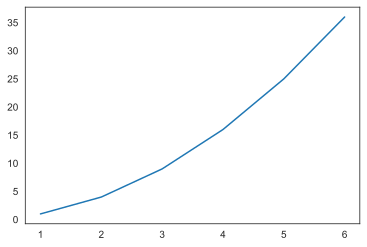

In [4]:
# простейший график y от x

x = [1, 2, 3, 4, 5, 6] 
y = [i ** 2 for i in x]

plt.plot(x, y)

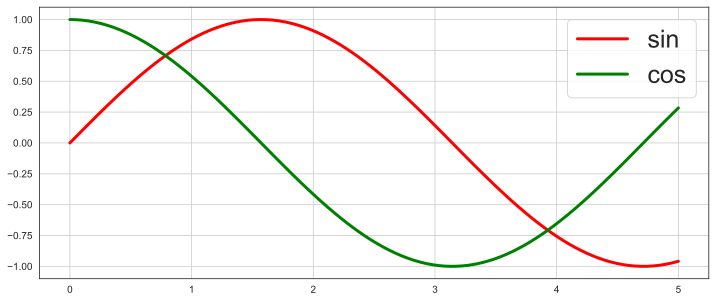

In [18]:
# добавим сетку, цвета и легенду

x = np.linspace(0, 5, 100)

plt.figure(figsize=(12, 5)) # размер канваса

plt.plot(x, np.sin(x), color='red', linewidth=3, label='sin')
plt.plot(x, np.cos(x), color='green', linewidth=3, label='cos')
plt.legend(loc='upper right', prop={'size':25})
plt.grid(True)

plt.show()

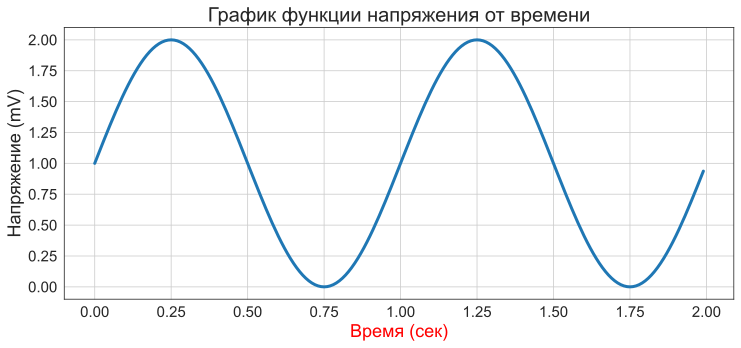

In [24]:
# добавим подписи и увеличим размер деления

t = np.arange(0.0, 2.0, 0.01)
s = 1 + np.sin(2 * np.pi * t)

plt.figure(figsize=(12, 5))

plt.title('График функции напряжения от времени', fontsize=20)

plt.plot(t, s, linewidth=3)
plt.grid(True)

plt.xlabel('Время (сек)', color='red', fontsize=18) # цвет и тут менять можно
plt.ylabel('Напряжение (mV)', fontsize=18)

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15)
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.show()

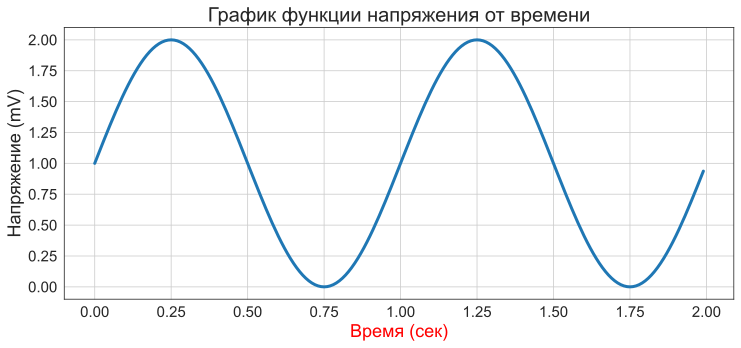

In [5]:
# все операции можно производить через объект Axes

plt.figure(figsize=(12, 5))

ax = plt.gca()

ax.set_title('График функции напряжения от времени', fontsize=20)
ax.plot(t, s, linewidth=3)
ax.grid(True)

ax.set_xlabel('Время (сек)', color='red', fontsize=18)
ax.set_ylabel('Напряжение (mV)', fontsize=18)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.show()

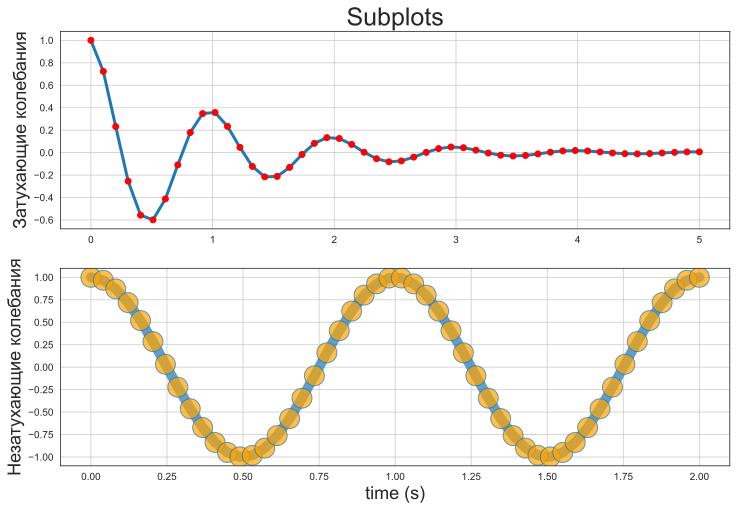

In [26]:
# составные графики - plt.subplot

x1 = np.linspace(0.0, 5.0)
x2 = np.linspace(0.0, 2.0)

y1 = np.cos(2 * np.pi * x1) * np.exp(-x1)
y2 = np.cos(2 * np.pi * x2)

plt.figure(figsize=(12, 8))

plt.subplot(2, 1, 1)

plt.plot(x1, y1, linewidth=3)
plt.plot(x1, y1, 'ro', linewidth=3)
plt.title('Subplots', fontsize=25)
plt.ylabel('Затухающие колебания', fontsize=18)
plt.grid(True)

plt.subplot(2, 1, 2)
plt.plot(x2, y2, '-o', ms=20, alpha=0.7, mfc='orange', linewidth=10)
plt.xlabel('time (s)', fontsize=18)
plt.ylabel('Незатухающие колебания', fontsize=18)
plt.grid(True)

plt.show()

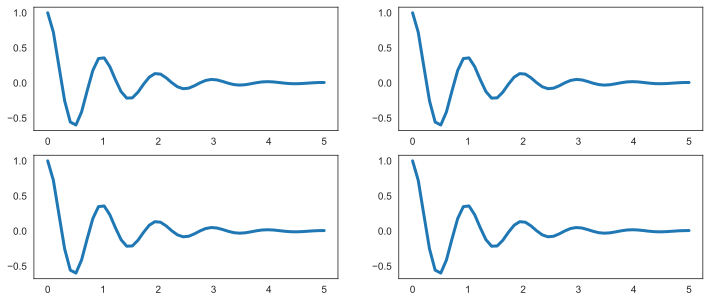

In [27]:
plt.figure(figsize=(12, 5))

plt.subplot(2, 2, 1)
plt.plot(x1, y1, linewidth=3)

plt.subplot(2, 2, 2)
plt.plot(x1, y1, linewidth=3)

plt.subplot(2, 2, 3)
plt.plot(x1, y1, linewidth=3)

plt.subplot(2, 2, 4)
plt.plot(x1, y1, linewidth=3)

plt.show()

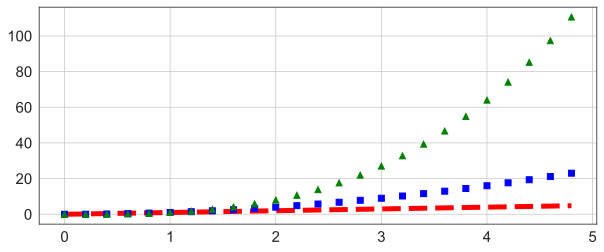

In [31]:
# cпецификаторы
# полный список:
# https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html#matplotlib.pyplot.plot

t = np.arange(0., 5., 0.2)

plt.figure(figsize=(10, 4))
plt.plot(t, t, 'r--', linewidth=5)
plt.plot(t, t ** 2, 'bs',linewidth=5)
plt.plot(t, t ** 3, 'g^', linewidth=5)
plt.grid(True)

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
    
plt.show()

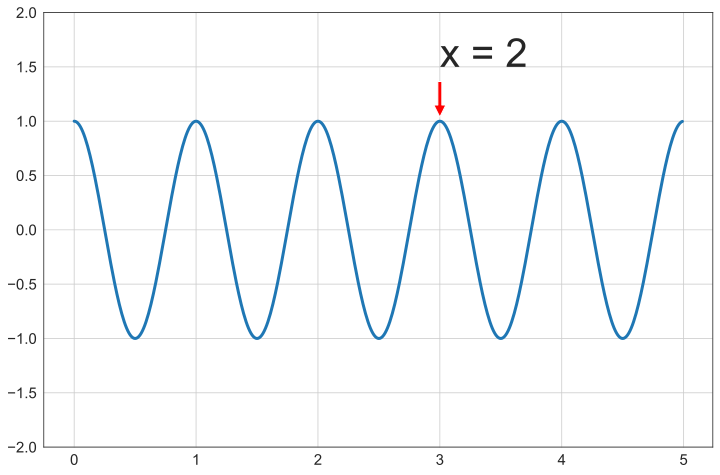

In [32]:
# аннтотации
# https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.annotate.html

t = np.arange(0.0, 5.0, 0.01)
s = np.cos(2 * np.pi * t)

plt.figure(figsize=(12, 8))
plt.plot(t, s, lw=3)
plt.annotate('x = 2', xy=(3, 1), xytext=(3, 1.5), arrowprops=dict(facecolor='red', shrink=0.09), size=40)
plt.ylim(-2,2)

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
    
plt.grid(True)
plt.show()

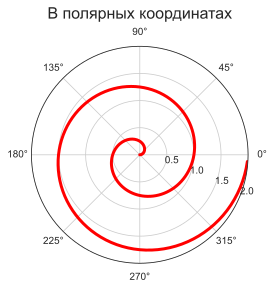

In [33]:
# поддерживаются разные типы координатных систем 

r = np.arange(0, 2, 0.01)
theta = 2 * np.pi * r

ax = plt.subplot(111, projection='polar') # указываем нужную проекцию
plt.title('В полярных координатах', y=1.1, fontsize=16)
ax.plot(theta, r, linewidth=3, color='red')
ax.set_rmax(1)
ax.set_rticks([0.5, 1, 1.5, 2])  # Less radial ticks
ax.set_rlabel_position(-22.5)  # Move radial labels away from plotted line
ax.grid(True)
plt.show()

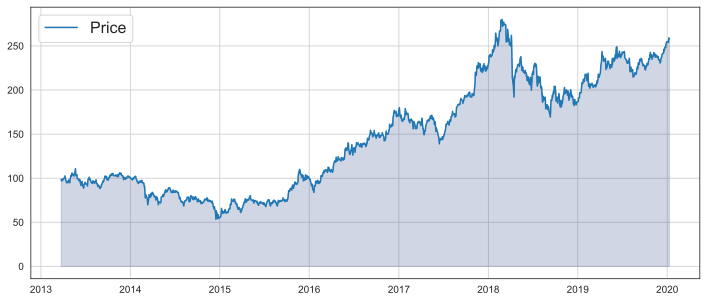

In [59]:
# Классическая визуализация временных рядов

ts = pd.read_csv('./data/sber_stocks.csv', usecols=['CLOSE', 'TRADEDATE'], 
                 index_col='TRADEDATE', parse_dates=True)
ts = ts.CLOSE

plt.figure(figsize=(12, 5))

plt.plot(ts, label='Price')
plt.fill_between(ts.index, ts, color=(0.1, 0.2, 0.5, 0.3), alpha=0.2) # заполняем цветом от оси до кривой
plt.legend(prop={'size': 16})
plt.grid(True)
#plt.xlim('2014-01-01', '2014-01-14') # умный индекс
plt.show()

In [61]:
Z = np.tile(ts.values, (10, 1))
Z

array([[ 98.79,  97.2 ,  96.75, ..., 259.15, 257.99, 258.19],
       [ 98.79,  97.2 ,  96.75, ..., 259.15, 257.99, 258.19],
       [ 98.79,  97.2 ,  96.75, ..., 259.15, 257.99, 258.19],
       ...,
       [ 98.79,  97.2 ,  96.75, ..., 259.15, 257.99, 258.19],
       [ 98.79,  97.2 ,  96.75, ..., 259.15, 257.99, 258.19],
       [ 98.79,  97.2 ,  96.75, ..., 259.15, 257.99, 258.19]])

In [12]:
# Визуализация временного ряда через тепловую карту

Z = np.tile(ts.values, (10, 1))

fig = plt.figure(figsize=(14, 5))
s = plt.pcolor(Z, cmap='RdBu') # https://matplotlib.org/3.2.0/tutorials/colors/colormaps.html
fig.colorbar(сs)
plt.show()

In [63]:
Z

array([[ 3.04599342e-08,  3.53672816e-08,  4.10139437e-08, ...,
         4.19694495e-08,  3.59915557e-08,  3.08143049e-08],
       [ 3.53672816e-08,  4.10652432e-08,  4.76216291e-08, ...,
         4.84016714e-08,  4.14911034e-08,  3.55076995e-08],
       [ 4.10139437e-08,  4.76216291e-08,  5.52247930e-08, ...,
         5.57277946e-08,  4.77509785e-08,  4.08463455e-08],
       ...,
       [ 4.19694495e-08,  4.84016714e-08,  5.57277946e-08, ...,
        -1.20875533e-03, -1.09715357e-03, -9.94611576e-04],
       [ 3.59915557e-08,  4.14911034e-08,  4.77509785e-08, ...,
        -1.09715357e-03, -9.95855618e-04, -9.02780992e-04],
       [ 3.08143049e-08,  3.55076995e-08,  4.08463455e-08, ...,
        -9.94611576e-04, -9.02780992e-04, -8.18405195e-04]])

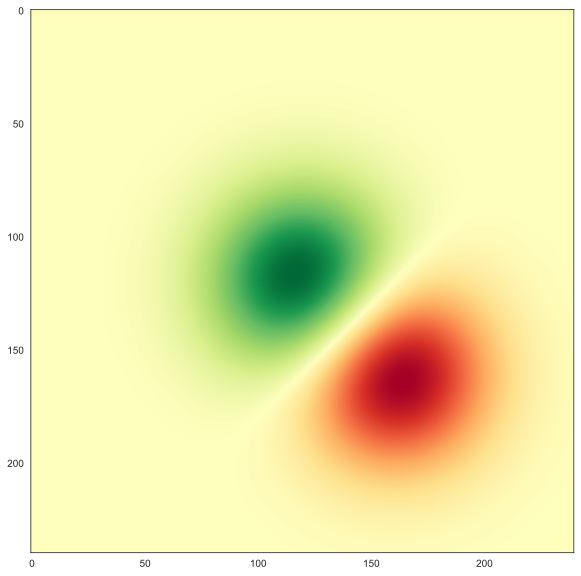

In [62]:
# Тепловая карта (HeatMap) для 3-х мерных данных
 
import matplotlib.cm as cm

delta = 0.025
x = y = np.arange(-3.0, 3.0, delta)
X, Y = np.meshgrid(x, y)

Z1 = np.exp(-X**2 - Y**2)
Z2 = np.exp(-(X - 1)**2 - (Y - 1)**2)
Z = (Z1 - Z2) * 2

# разные методы интерполяции
# https://matplotlib.org/3.1.1/gallery/images_contours_and_fields/interpolation_methods.html

plt.figure(figsize=(20, 10))
ax = plt.gca()
im = ax.imshow(Z, interpolation='bilinear', cmap=cm.RdYlGn)
plt.show()

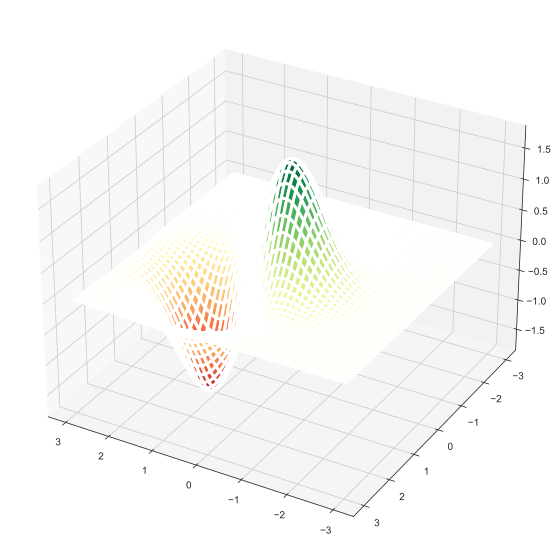

In [66]:
# можно визуализировать напрямую в 3D

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15, 10))
ax = fig.gca(projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap=cm.RdYlGn, linewidth=3)

angle = 120
ax.view_init(30, angle)

plt.show()

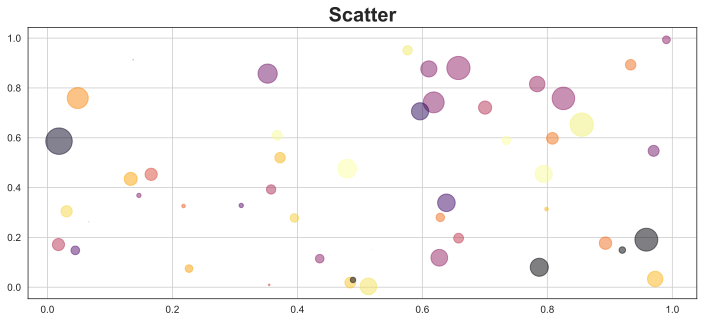

In [76]:
# Скаттер 

N = 50
x = np.random.rand(N)
y = np.random.rand(N)
colors = np.random.rand(N)
area = np.pi * (15 * np.random.rand(N))**2 

plt.figure(figsize=(12, 5))
plt.title('Scatter', fontweight='bold',  fontsize=20)

plt.scatter(x, y, s=area, c=colors, cmap='inferno', alpha=0.5) 

plt.grid(True)
plt.show()

In [80]:
x

array([100.19678341,  78.42405801,  95.88290326, ..., 117.41368036,
       112.48137326,  68.88814693])

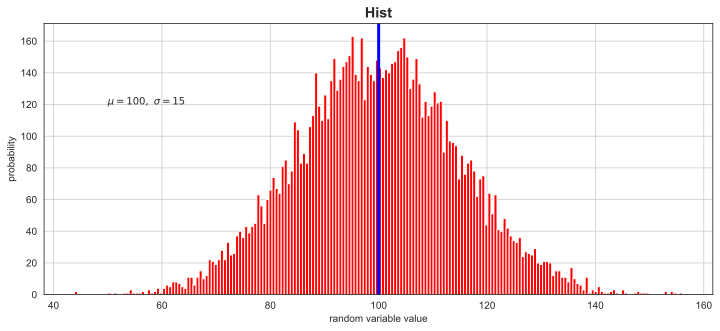

In [87]:
# Гистограмма

mu, sigma = 100, 15
x = mu + sigma * np.random.randn(10000)

plt.figure(figsize=(12, 5))
plt.title('Hist', fontweight='bold', fontsize='x-large')
plt.hist(x, bins=200, facecolor='r')

plt.xlabel('random variable value')
plt.ylabel('probability')
plt.text(50, 120, r'$\mu=100,\ \sigma=15$')

plt.axvline(x=100, color='blue', lw=3)

plt.grid(True)
plt.show()


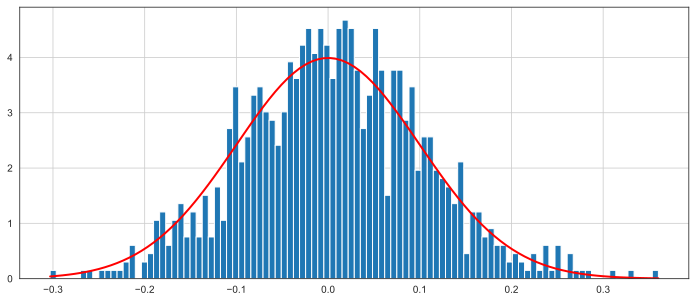

In [96]:
# + огибающая 

mu, sigma = 0, 0.1
s = np.random.normal(mu, sigma, 1000)

plt.figure(figsize=(12, 5))
count, bins, ignored = plt.hist(s, 100, density=True)
plt.plot(bins, 1/(sigma * np.sqrt(2 * np.pi)) * np.exp(- (bins - mu)**2 / (2 * sigma**2) ),
         linewidth=2, color='r')
plt.grid(True)
plt.show()

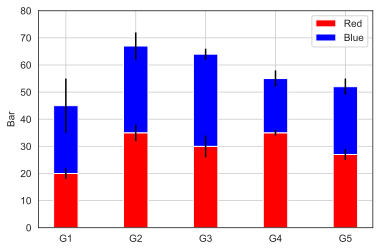

In [100]:
# Бар плот

N = 5
red = (20, 35, 30, 35, 27)
blue = (25, 32, 34, 20, 25)
red_sdt = (2, 3, 4, 1, 2)
blue_std = (10, 5, 2, 3, 3)
ind = np.arange(N)
width = 0.35

p1 = plt.bar(ind, red, width, color='r', yerr=red_sdt) # можно и горизонтальную - plt.barh
p2 = plt.bar(ind, blue, width, color='b', bottom=red, yerr=blue_std)

plt.ylabel('Bar')
plt.xticks(ind, ('G1', 'G2', 'G3', 'G4', 'G5'))
plt.yticks(np.arange(0, 81, 10))
plt.legend((p1[0], p2[0]), ('Red', 'Blue'))
plt.grid(True)
plt.show()

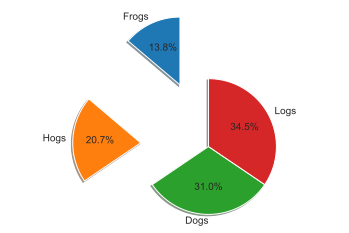

In [106]:
# Пай плот

labels = 'Frogs', 'Hogs', 'Dogs', 'Logs'
sizes = [20, 30, 45, 50]
explode = (1, 1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

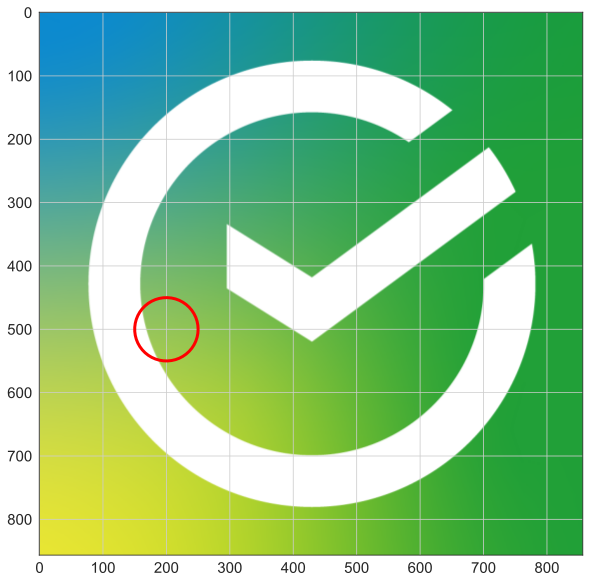

In [107]:
# можно рисовать свои картинки поверх заданных

im = plt.imread("./pict/sber_logo.png")

plt.figure(figsize=(15, 10))
implot = plt.imshow(im)

theta = np.linspace(0, 2 * np.pi, 50)
z = np.cos(theta) * 50 + 200
t = np.sin(theta) * 50 + 500
plt.plot(z, t, lw=3, color='red')

ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(15) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(15) 

plt.grid(True)
plt.show()

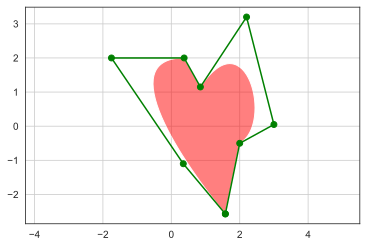

In [21]:
# Бонус

import matplotlib.path as mpath
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt


fig, ax = plt.subplots()

Path = mpath.Path

path_data = [
    (Path.MOVETO, (1.58, -2.57)),
    (Path.CURVE4, (0.35, -1.1)),
    (Path.CURVE4, (-1.75, 2.0)),
    (Path.CURVE4, (0.375, 2.0)),
    (Path.LINETO, (0.85, 1.15)),
    (Path.CURVE4, (2.2, 3.2)),
    (Path.CURVE4, (3, 0.05)),
    (Path.CURVE4, (2.0, -0.5)),
    (Path.CLOSEPOLY, (1.58, -2.57)),
    ]

codes, verts = zip(*path_data)
path = mpath.Path(verts, codes)
patch = mpatches.PathPatch(path, facecolor='r', alpha=0.5)
ax.add_patch(patch)

# plot control points and connecting lines
x, y = zip(*path.vertices)
line, = ax.plot(x, y, 'go-')

ax.grid()
ax.axis('equal')
plt.show()

<center>
<img src="./pict/plotly_dash_logo.jpg">
<br />
<br />

In [110]:
# !pip install plotly  # устанавливаем библиотеки

# https://plotly.com - обширная докуаментация

In [114]:
import plotly # импортируем библиотеку
import plotly.graph_objects as go # основной модуль
import plotly.express as px # самый популярные графики

Основной объект - __Figure__, можно мыслить как __dict__

In [112]:
import plotly.io as pio
import numpy as np

x = np.arange(1, 7)

fig = dict({
    "data": [{"type": "scatter",
              "x": x,
              "y": x ** 2, 
              'marker':{'size':10}}],
    
    "layout": {"title": {"text": "Простейший график y от x"}}
})

print(fig)

pio.show(fig)

{'data': [{'type': 'scatter', 'x': array([1, 2, 3, 4, 5, 6]), 'y': array([ 1,  4,  9, 16, 25, 36]), 'marker': {'size': 10}}], 'layout': {'title': {'text': 'Простейший график y от x'}}}


In [116]:
fig = go.Figure(data=go.Scatter(x=x, y=x**2, marker_size=10), 
                layout={'title':{'text':"Простейший график y от x"}})

print(fig)

fig

Figure({
    'data': [{'marker': {'size': 10},
              'type': 'scatter',
              'x': array([1, 2, 3, 4, 5, 6]),
              'y': array([ 1,  4,  9, 16, 25, 36])}],
    'layout': {'template': '...', 'title': {'text': 'Простейший график y от x'}}
})


In [117]:
fig = go.Figure(data=go.Scatter(x=x, y=x**2, marker_size=10), 
                layout_title_text='Простейший график y от х') # а можно и вот так

print(fig)

fig.show() # и вот так

Figure({
    'data': [{'marker': {'size': 10},
              'type': 'scatter',
              'x': array([1, 2, 3, 4, 5, 6]),
              'y': array([ 1,  4,  9, 16, 25, 36])}],
    'layout': {'template': '...', 'title': {'text': 'Простейший график y от х'}}
})


In [28]:
x = np.linspace(0, 5, 100)

fig = go.Figure(data=go.Line(x=x, y=np.sin(x), name='sin', line_color='blue'))

fig.add_trace(go.Line(x=x, y=np.cos(x), name='cos', line_color='red')) # добавление еще объектов на Figure
fig.update_layout(xaxis_tickfont_size=20)

fig.show()

In [118]:
from plotly.subplots import make_subplots

x1 = np.linspace(0.0, 5.0)
x2 = np.linspace(0.0, 2.0)

y1 = np.cos(2 * np.pi * x1) * np.exp(-x1)
y2 = np.cos(2 * np.pi * x2)


fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Scatter(x=x1, y=y1, mode='lines', line_color='blue'), row=1, col=1)
fig.add_trace(go.Scatter(x=x1, y=y1, mode='markers', marker_size=5, marker_color='red'), row=1, col=1)
fig.update_layout(showlegend=False)

fig.add_trace(go.Scatter(x=x2, y=y2, mode='markers+lines', line_width=1, line_color='blue', 
                         marker_color='orange', marker_size=15, marker_opacity=0.8), row=2, col=1)

fig.update_layout(showlegend=False)

fig.show()

In [119]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1)

fig.add_scatter(x=x1, y=y1, mode='lines+markers', line_color='blue', marker_size=5, marker_color='red',
                row=1, col=1)

fig.add_scatter(x=x2, y=y2, mode='markers+lines', line_width=1, line_color='blue', 
                         marker_color='orange', marker_size=15, marker_opacity=0.8, row=2, col=1)

fig.update_layout(title_text='Subplots in Plotly',
                  title_font_size=30)

# fig.update_layout(title=go.layout.Title(text="Subplots in Plotly",
#                                         font=go.layout.title.Font(size=30)))

# fig.update_layout({"title": {"text": "Subplots in Plotly",
#                              "font": {"size": 30}}})


fig.show()

In [120]:
fig = px.line(ts) # через px синтаксис напоминает plt.plot
fig

In [121]:
df = px.data.gapminder() 
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


In [122]:
df = px.data.gapminder() # визуализация DataFrame через Plotly Exprerss

fig = px.scatter(df[df['year']==2007], x="gdpPercap", y="lifeExp", size="pop", color="continent",
           hover_name="country", log_x=True, size_max=60)
fig.show()

In [123]:
df = px.data.gapminder() # https://plotly.com/python/plotly-express/

fig = px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country", facet_col="continent",
           log_x=True, size_max=45, range_x=[100, 100000], range_y=[25, 90])

fig.show()

In [124]:
# !pip install dash - устанавливаем модуль

import dash
import dash_core_components as dcc
import dash_html_components as html

app = dash.Dash()

app.layout = html.Div([
    dcc.Graph(figure=fig)
])

app.run_server(host = '127.0.0.1')  # Turn off reloader if inside Jupyter

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:8050/ (Press CTRL+C to quit)
127.0.0.1 - - [08/Apr/2021 20:10:51] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [08/Apr/2021 20:10:51] "GET /_dash-component-suites/dash_renderer/polyfill@7.v1_9_0m1617877617.8.7.min.js HTTP/1.1" 200 -
127.0.0.1 - - [08/Apr/2021 20:10:51] "GET /_dash-component-suites/dash_renderer/react@16.v1_9_0m1617877617.14.0.min.js HTTP/1.1" 200 -
127.0.0.1 - - [08/Apr/2021 20:10:51] "GET /_dash-component-suites/dash_renderer/prop-types@15.v1_9_0m1617877617.7.2.min.js HTTP/1.1" 200 -
127.0.0.1 - - [08/Apr/2021 20:10:51] "GET /_dash-component-suites/dash_html_components/dash_html_components.v1_1_2m1617877619.min.js HTTP/1.1" 200 -
127.0.0.1 - - [08/Apr/2021 20:10:51] "GET /_dash-component-suites/dash_core_components/dash_core_components-shared.v1_15_0m1617877618.js HTTP/1.1" 200 -
127.0.0.1 - - [08/Apr/2021 20:10:51] "GET /_dash-component-suites/dash_renderer/react-dom@16.v1_9_0m1617877617.14.0.min.js HTTP/1.1" 200 -
127.0.0.1 - - [08/Apr/2021 20

In [37]:
# Бонус
from sklearn.svm import SVR # применительно к ML
                            # пример визуализации модели 
                            # https://plotly.com/building-machine-learning-web-apps-in-python/

mesh_size = .02
margin = 0

df = px.data.iris()

X = df[['sepal_width', 'sepal_length']]
y = df['petal_width']

# Condition the model on sepal width and length, predict the petal width
model = SVR(C=1., gamma='auto')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.sepal_width.min() - margin, X.sepal_width.max() + margin
y_min, y_max = X.sepal_length.min() - margin, X.sepal_length.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='sepal_width', y='sepal_length', z='petal_width')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface'))
fig.show()